# **🐶 Dog Breed Identification**

* Source: https://www.kaggle.com/c/dog-breed-identification
* Colab help: 
  - https://colab.research.google.com/notebooks/io.ipynb
  - https://colab.research.google.com/notebooks/intro.ipynb


This notebook builds an End-to-End multiclass image classifier using TensorFlow 2.0 and TensorFlowHub.

**Problem**
>Determine the breed of a 🐶 dog in an image.

**Data**
>Source: [Dog Breed Identification](https://www.kaggle.com/competitions/dog-breed-identification/data)
>* **train.zip** - the training set, you are provided the breed for these dogs
>* **test.zip** - the test set, you must predict the probability of each breed for each image
sample_submission.csv - a sample submission file in the correct format
>* **labels.csv** - the breeds for the images in the train set

**Evaluation**
>Predictions are evaluated on Multi Class Log Loss between the predicted probability and the observed target.
>
>For each image in the test set, you must predict a probability for each of the different breeds. 
>
>The file with the predictions should contain a header and have the following format:
>
>| id |affenpinscher | afghan_hound | .. | yorkshire_terrier |
| :- | -: | -: | :- | -: |
| 000621fb3cbb32d8935728e48679680e | 0.0083 |0.0 | ... | 0.0083 |

## **1. EXPLORING THE DATA 📁📁📁📁📁**

In [1]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
# Prepare the environment
import pandas as pd
import matplotlib.pyplot as plt
import os
import numpy as np
import datetime

from IPython.display import Image
from google.colab import data_table
from matplotlib.pyplot import imread
from operator import itemgetter

# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub

from sklearn.model_selection import train_test_split

In [7]:
# Display plots inline
%matplotlib inline

# Load TensorBoard notebook extension
%load_ext tensorboard

# Setting pandas to display data
pd.set_option('display.max_colwidth', None)

# Enable interactive tables
data_table.enable_dataframe_formatter()

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [8]:
# Read training data
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/labels.csv')
df.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [4]:
df.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [5]:
# How many images are there for each bread?
df.breed.value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

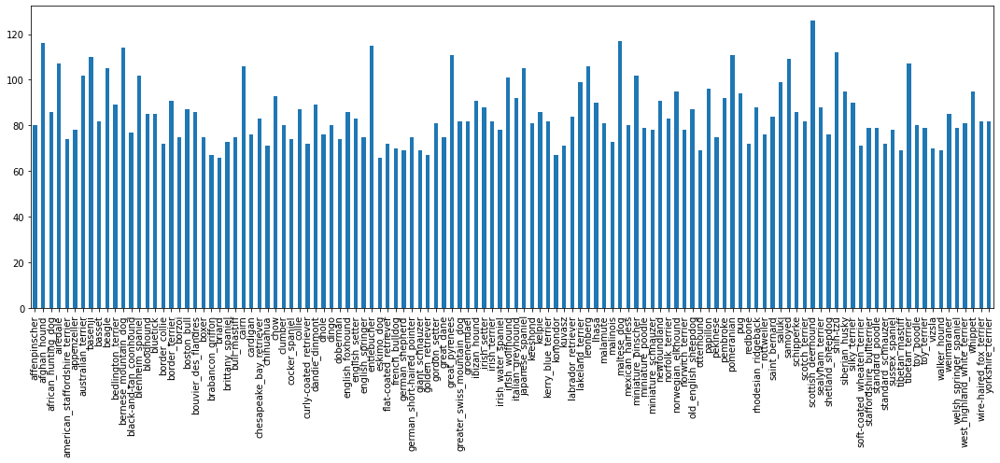

In [7]:
df.breed.value_counts().sort_index().plot(figsize=(15,7), kind='bar', rot=90)
plt.tight_layout()

In [8]:
df.breed.value_counts().median()

82.0

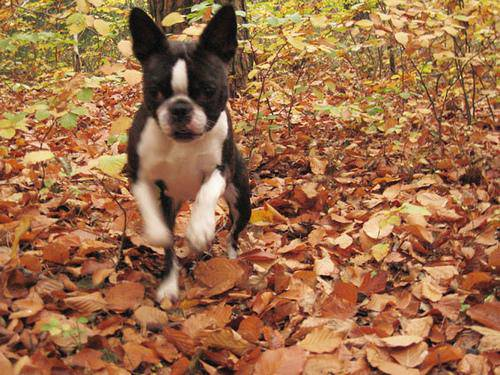

In [9]:
# Let's view an image
Image('/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

## 2. Preparing the data 🍳🍳🍳🍳🍳

In [9]:
# Create pathname's from images IDs
pd.set_option('display.max_colwidth', None)
df['image_path'] = '/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/train/' + df.id + '.jpg' 
df.head(2)

,id,breed,image_path
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull,/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo,/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg


In [11]:
# Checking the corresponds between the ids and files we have in train folder
training_files = os.listdir('/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/train')

if len(training_files) != len(df.id):
   print('The total files does not match with the total ids')

if np.sum(np.array(sorted(training_files)) == df.id.sort_values() + '.jpg') != len(training_files):
  print('Some files are missing...')

print('Validation completed!')

Validation completed!


dhole


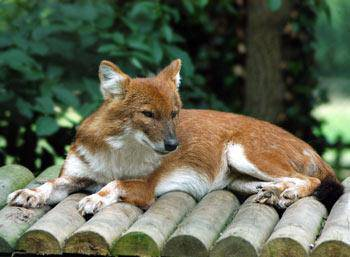

In [12]:
# Exploring again in the dataset
print(df.breed[42])
Image(df.image_path[42])

255 0


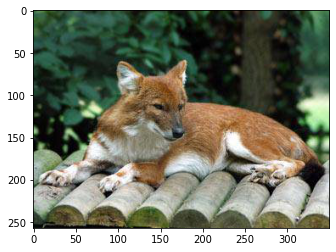

In [13]:
image = imread(df.image_path[42])
print(image.max(), image.min())
plt.imshow(image)

In [10]:
# Finding unique labels
unique_labels = df.breed.sort_values().unique()
len(unique_labels)

120

## **3. Setting the global variables 🪣🪣🪣🪣🪣**

In [11]:
# Define the batch size
BATCH_SIZE = 32

In [12]:
# Define image size
IMG_SIZE = 224 # Size attached to the machine learning model

In [13]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

In [14]:
# Setup output shape of our model
OUTPUT_SHAPE = len(unique_labels)

In [15]:
# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [16]:
# Set numbers of images to use for experimenting
NUM_IMAGES = 10222 #@param {type:'slider', min:1000, max: 10222, step: 1}

In [17]:
NUM_EPOCHS = 100 #@param {type: 'slider', min:10, max:100, step:10}

In [18]:
VALID_DATA_PERCENT = 0 #@param {type: 'slider', min:0, max:0.3, step:0.1}

## **4. Getting X & y ⚓⚓⚓⚓⚓**

In [14]:
# Setup X and y
Xdata = df.image_path
ydata = pd.get_dummies(df.breed)

X = Xdata.tolist()[:NUM_IMAGES]
y = ydata.values.tolist()[:NUM_IMAGES]

## **5. Getting training and valid set for our Machine Learning model ⚾⚾⚾⚾⚾**

In [19]:
# Create a function for preprocess the images
def process_image(image_path):
  """
  Take imagepath and transform it into a Tensor.
  """
  image = tf.io.read_file(image_path) # Read in an image file
  image = tf.image.decode_jpeg(image, channels=3) # Turn the jpg image into numerical tensor with 3 colors channel (R, G, B)
  image = tf.image.convert_image_dtype(image, tf.float32) # Normalize the image, from 0-255 to 0-1
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE]) # Resize the image to our desired value (224, 224)
  return image

In [20]:
# Create a function to return the tensor tuples
def get_image_label(image_path, label):
  """
  Takes an image path and label and return a tuple of the preprocess image path and its label.
  """
  return process_image(image_path), label

In [21]:
# Create a function to transform our data into batches of BATCH_SIZE size
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffle the data if it is training data but does not shuffle if it is validate data.
  Also accepts test data as input (no labels)
  """
  # When data is test_data, it will not have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths no labels.
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
    
  # When data is valid_data, we do not need to shuffle
  elif valid_data:
    print('Creating valid data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    
  else: 
    print('Creating training data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data = data.shuffle(buffer_size=len(X)) # Shuffling before mapping
  
  data_batch = data.map(get_image_label).batch(BATCH_SIZE)
  return data_batch

In [27]:
if VALID_DATA_PERCENT:
  # Split into train and valid sets
  X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=VALID_DATA_PERCENT, stratify=y, random_state=42)

  # Create validation data batches
  train_data = create_data_batches(X_train, y_train)
  valid_data = create_data_batches(X_valid, y_valid, valid_data=True)  
else:
  # Split into train and valid sets
  X_train, y_train = X, y
  X_valid, y_valid = None, None

# Create training data batches
train_data = create_data_batches(X_train, y_train)  

Creating training data batches...


In [28]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.int32, name=None))>

In [29]:
if VALID_DATA_PERCENT:
  valid_data

**Visualizing Data Batches**

In [18]:
def show_10_images(images, labels, n=10):
  """
  Displays a plot of 10 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(15, 5))

  # Loop through 10 (for displaying 10 images)
  for i in range(10):
    # Create subplots (2 rows, 5 columns)
    ax = plt.subplot(2, 5, i+1)
    # Display an image 
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_labels[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

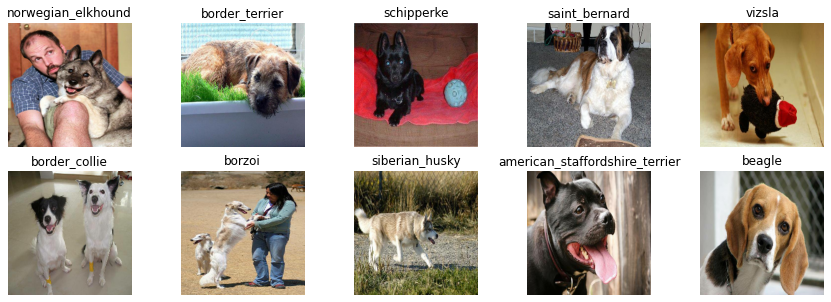

In [31]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_10_images(train_images, train_labels)

In [32]:
if VALID_DATA_PERCENT:
  # Now let's visualize the data in a valid batch
  valid_images, valid_labels = next(valid_data.as_numpy_iterator())
  show_10_images(valid_images, valid_labels)

In [33]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)

if X_valid:
  valid_data = create_data_batches(X_valid, y_valid, valid_data=True)
else:
  valid_data = None

Creating training data batches...


## **6. Creating and preparing the model (Transfer Learning) 🛂🛂🛂🛂🛂**

In [19]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL, metrics=["accuracy"]):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile( 
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=metrics
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [35]:
# Fit the model
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## **7. Training the model ⏭⏭⏭⏭⏭**

In [20]:
# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing Tensorboard logs
  logdir = os.path.join('/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/logs',
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

In [37]:
# Create early stopping callback
# When training on all data, we can not track on valida data (val_accuracy) so we specified just "accuracy"
monitor_metric = 'val_accuracy' if X_valid else 'accuracy'
early_stopping = tf.keras.callbacks.EarlyStopping(monitor=monitor_metric, patience=3)

In [38]:
# Check to make sure we're still running on a GPU
print("GPU", "Available!" if tf.config.list_physical_devices("GPU") else 'Not available!')

GPU Available!


In [21]:
# Build a function to train and return a trained model
def train_model(model, train_data, valid_data, callbacks):
  """
  Trains a given model and returns the trained version.
  """
  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq=1 if valid_data else None,
            callbacks=callbacks)
  # Return the fitted model
  return model

In [40]:
# Create a model
model = create_model()

# Create new TensorBoard session everytime we train a model
tensorboard = create_tensorboard_callback()

# Fit the model to the data
model = train_model(model, train_data, valid_data, [tensorboard, early_stopping])

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
320/320 [==============================] - 155s 433ms/step - loss: 1.3283 - accuracy: 0.6753
Epoch 2/100
320/320 [==============================] - 37s 114ms/step - loss: 0.3959 - accuracy: 0.8829
Epoch 3/100
320/320 [==============================] - 38s 118ms/step - loss: 0.2324 - accuracy: 0.9388
Epoch 4/100
320/320 [==============================] - 38s 117ms/step - loss: 0.1513 - accuracy: 0.9639
Epoch 5/100
320/320 [==============================] - 38s 119ms/step - loss: 0.1060 - accuracy: 0.9784
Epoch 6/100
320/320 [==============================] - 38s 120ms/step - loss: 0.0767 - accuracy: 0.9873
Epoch 7/100
320/320 [==============================] - 38s 119ms/step - loss: 0.0568 - accuracy: 0.9924
Epoch 8/100
320/320 [==============================] - 39s 122ms/step - loss: 0.0449 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 40s 126ms/step - lo

## **8. Savint the model**

In [22]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [22]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [25]:
# Save our model trained on 1000 images
#save_model(model, suffix="full-images-mobilenetv2-Adam")

In [23]:
# Load a trained model
model = load_model('/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/models/20221007-08401665132013-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/models/20221007-08401665132013-1000-images-mobilenetv2-Adam.h5


## **8. Checking the TensorBoard logs 🔍🔍🔍🔍🔍**

In [45]:
%tensorboard --logdir /content/drive/MyDrive/Colab\ Notebooks/Neural\ Networks\ \|\ TensorFlow/logs

<IPython.core.display.Javascript object>

## **9. Making predictions ➿➿➿➿➿**

In [67]:
# Read test data
test_data_path = '/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/test/'
df_test = pd.DataFrame({
    'id': os.listdir(test_data_path)
}) 

df_test['image_path'] = df_test['id'].apply(lambda x: test_data_path + x)
df_test['id'] = df_test['id'].apply(lambda x: os.path.splitext(x)[0])
df_test.head()

,id,image_path
0,de2c6675c001726a96ad9d72ab229f3a,/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/test/de2c6675c001726a96ad9d72ab229f3a.jpg
1,deec3d206b0f5c927c86ed1782990961,/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/test/deec3d206b0f5c927c86ed1782990961.jpg
2,e5e51d0dfc3ccdb74de51933b2671742,/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/test/e5e51d0dfc3ccdb74de51933b2671742.jpg
3,e1fa4eb8a57184773ac11efe0de11e92,/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/test/e1fa4eb8a57184773ac11efe0de11e92.jpg
4,e71d9f32ea6eb1c2d944e8f4e811c209,/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/test/e71d9f32ea6eb1c2d944e8f4e811c209.jpg


In [68]:
# Create test data batch
X_test = df_test.image_path.tolist()
test_data = create_data_batches(X_test, test_data=True)

Creating test data batches...


In [65]:
# Make predictions on the test data (not used to train on)
predictions = model.predict(test_data, verbose=1)
predictions

324/324 [==============================] - 1969s 6s/step


array([[9.1019906e-02, 2.9884261e-04, 2.3494988e-05, ..., 2.3522818e-02,
        6.1037304e-04, 1.0840909e-02],
       [2.3140444e-04, 2.2180828e-03, 5.3639789e-05, ..., 3.2268435e-05,
        9.6448646e-05, 7.2755924e-05],
       [1.9684744e-04, 1.0112651e-03, 2.3143123e-04, ..., 5.3279662e-05,
        2.3600198e-05, 2.9475542e-04],
       ...,
       [3.9356568e-05, 4.9772887e-03, 9.8097499e-04, ..., 9.7051719e-03,
        5.7564920e-04, 1.4544145e-04],
       [7.0956594e-05, 5.1383581e-04, 1.9053601e-04, ..., 1.5912539e-05,
        1.4586475e-04, 1.1349475e-04],
       [2.3069177e-04, 3.5592713e-04, 3.2309492e-04, ..., 5.0724449e-04,
        2.1549668e-04, 1.2088999e-03]], dtype=float32)

In [66]:
predictions.shape

(10357, 120)

## **10. Saving the predictions**

In [70]:
#np.savetxt('/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/predictions/full_train_predictions.csv', predictions, delimiter=',')

In [69]:
# Loading the saved predictions
predictions = np.loadtxt('/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/predictions/full_train_predictions.csv', delimiter=',')

## **11. Evaluating the model**

In [26]:
breed_predicted = predictions.argmax(axis=1)
breed_predicted, breed_predicted.shape 

(array([ 94,  91,  62, ...,  93,  83, 103]), (10357,))

In [74]:
unique_labels[breed_predicted]

array(['samoyed', 'rottweiler', 'keeshond', ..., 'saluki', 'otterhound',
       'soft-coated_wheaten_terrier'], dtype=object)

Predicted: briard (77.94%)


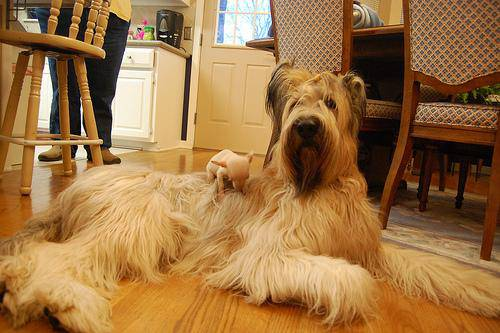

In [78]:
# Exploring again in the dataset
n = 10
print('Predicted: {} ({:.2f}%)'.format(unique_labels[breed_predicted[n]],
                                       predictions[n].max()*100))
Image(X_test[n])

In [70]:
test_data_images = list(test_data.unbatch().as_numpy_iterator())

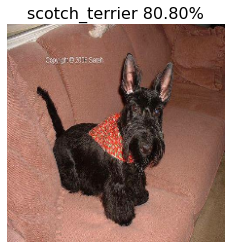

In [22]:
# Let´s visualize them using matplotlib
n = 3
pred_prob, pred_label = predictions[n].max()*100, unique_labels[predictions[n].argmax()]
test_image = test_data_images[n]

# Plot image & remove ticks
plt.imshow(test_image)
plt.axis('off')

# Change plot title to be predicted, probability of prediction and truth label
plt.title("{} {:.2f}%".format(pred_label, pred_prob), fontsize=16);
plt.show()

In [27]:
# Define a function to plot 10 predicted breeds
def plotting_10_predicted_breeds(predicted_index, title, predicted_label, predicted_proba, valid_data_labels, valid_data_images, unique_labels):
  pred_labels, pred_probas = predicted_label[predicted_index], predicted_proba[predicted_index]
  if valid_data_labels:
    true_labels, true_images = unique_labels[valid_data_labels[predicted_index]], valid_data_images[predicted_index]
  else:
    true_labels, true_images = None, itemgetter(*predicted_index)(valid_data_images)

  # Setup the figure
  fig = plt.figure(figsize=(18, 8))

  # Loop through 10 (for displaying 10 images)
  for i in range(10):
    # Create subplots (2 rows, 5 columns)
    ax = plt.subplot(2, 5, i+1)
    
    # Display an image 
    plt.imshow(true_images[i])
    plt.axis("off")

    # Change the colour of the title depending on if the prediction is right or wrong
    if valid_data_labels:
      color = "green" if pred_labels[i] == true_labels[i] else "red"
  
      # Change plot title to be predicted, probability of prediction and truth label
      plt.title("{} {:.2f}%\n({})".format(pred_labels[i], pred_probas[i], true_labels[i]), color=color);
  
    else:
      plt.title("{} {:.2f}%".format(pred_labels[i], pred_probas[i]));
    
  fig.suptitle(title, fontweight='bold')
  plt.subplots_adjust(left=None, right=None, bottom=None, top=None, hspace=1, wspace=.4);
  fig.tight_layout(rect=[0, 0.03, 1, 0.95]) #(left, bottom, right, top),
  plt.show()

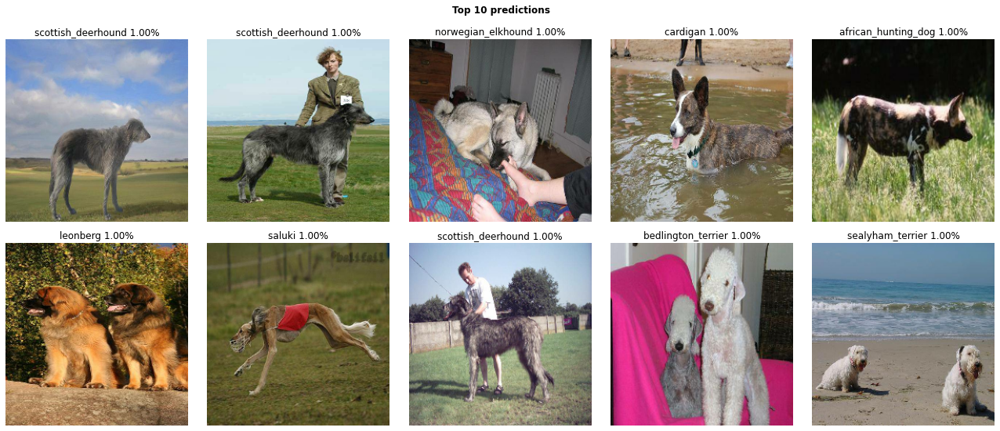

In [26]:
# Let's plot the top 10 predictions
predicted_label = unique_labels[predictions.argmax(axis=1)]
predicted_proba = predictions.max(axis=1)

top_10_breed_predicted = np.argsort(predicted_proba)[::-1][:10]

plotting_10_predicted_breeds(top_10_breed_predicted, 'Top 10 predictions', 
                             predicted_label, predicted_proba, 
                             None, test_data_images, 
                             unique_labels=unique_labels)

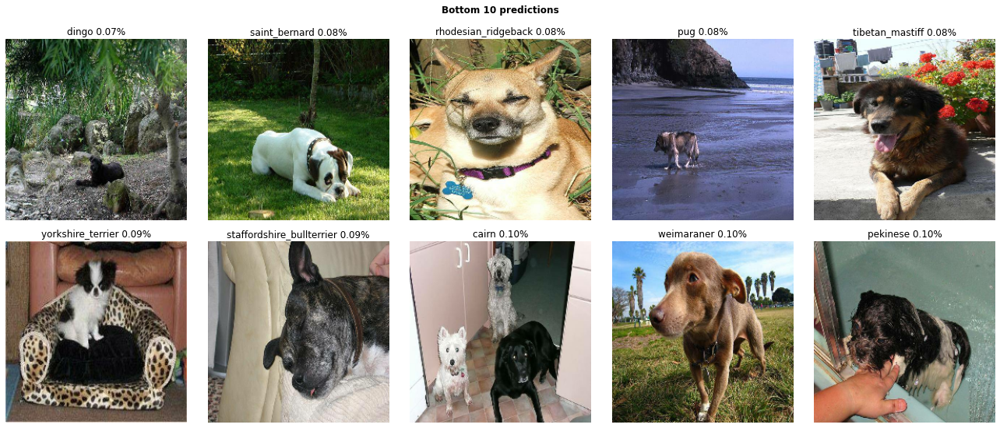

In [27]:
# Let's plot the bottom 10 predictions
top_10_breed_predicted = np.argsort(predicted_proba)[:10]

plotting_10_predicted_breeds(top_10_breed_predicted, 'Bottom 10 predictions', 
                             predicted_label, predicted_proba, 
                             None, test_data_images, 
                             unique_labels)

In [71]:
# Let's define a function to plot the top 10 predictions in a n item.
def plloting_pred_conf(n, predictions, valid_data_labels, valid_data_images, unique_labels):
  # Get the item
  pred_label, pred_probas = unique_labels[predictions.argmax(axis=1)][n], predictions[n]
  if valid_data_labels:
    true_label, true_image = unique_labels[valid_data_labels[n]], valid_data_images[n]
  else:
    true_label, true_image = None, valid_data_images[n]

  
  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_probas.argsort()[-10:][::-1]
  top_10_pred_values = pred_probas[top_10_pred_indexes]
  top_10_pred_labels = unique_labels[top_10_pred_indexes]

  # Setup plot
  fig, ax = plt.subplots(1, 2, figsize=(10, 6))
  top_plot = ax[0].bar(top_10_pred_labels, top_10_pred_values, color="gray")
  ax[0].tick_params(axis='x', rotation=90)

  if valid_data_labels:
    # Change color of true label
    result_preds = (top_10_pred_labels == true_label)
    if result_preds.any():
      top_plot[np.argmax(result_preds)].set_color("green")

    # Change the colour of the title depending on if the prediction is right or wrong
    color = "green" if pred_label == true_label else "red"
    fig.suptitle("{} {:.2f}% | {}".format(pred_label, top_10_pred_values[0], true_label), color=color, fontsize=16);
  else:
    fig.suptitle("{} {:.2f}%".format(pred_label, top_10_pred_values[0]), fontsize=16);
    
  # Plot image & remove ticks
  ax[1].imshow(true_image)
  ax[1].axis('off')

  plt.subplots_adjust(left=None, right=None, bottom=None, top=None, hspace=1, wspace=.4);
  fig.tight_layout(rect=[0, 0.03, 1, 0.95]) #(left, bottom, right, top)
  plt.show()

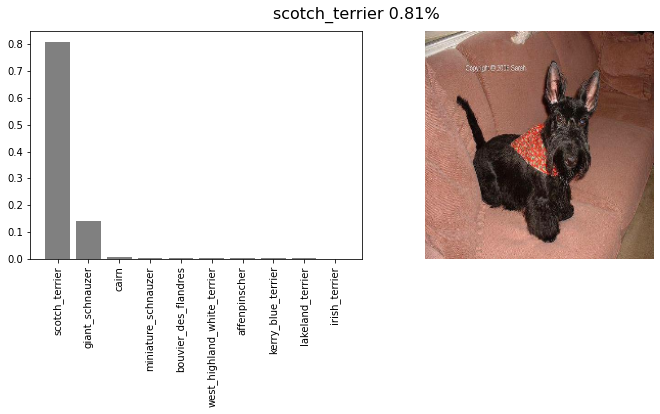

In [31]:
# Let's plot the confidence for an item
n=3
plloting_pred_conf(n, predictions, None, test_data_images, unique_labels)

In [80]:
from pyparsing import java_style_comment
# Let's define a function to plot the top 10 predictions of a random n items.
def plloting_pred_conf_for_n_items(predictions, valid_data_labels, valid_data_images, unique_labels, n=6):
  # Get the item
  n_items = sorted(list(np.random.choice(range(len(predictions)), n, replace=False)))
  pred_labels, pred_probas = unique_labels[predictions.argmax(axis=1)], predictions
  if valid_data_labels:
    true_labels, true_images = unique_labels[valid_data_labels], valid_data_images
  else:
    true_labels, true_images = None, valid_data_images
  
  ncols = 4
  nrows = int(np.ceil(n*2/ncols))
  fig, ax = plt.subplots(nrows, ncols, figsize=(18, 6*nrows))
  n_axes = [(r, c) for r in range(nrows) for c in range(ncols)]
  for i, item in enumerate(n_items):
    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_probas[item].argsort()[-10:][::-1]
    top_10_pred_values = pred_probas[item][top_10_pred_indexes]
    top_10_pred_labels = unique_labels[top_10_pred_indexes]

    # Setup plot
    j, k = n_axes[i*2]
    top_plot = ax[j, k].bar(top_10_pred_labels, top_10_pred_values, color="gray")
    ax[j, k].tick_params(axis='x', rotation=90)

    if valid_data_labels:
      # Change color of true label
      result_preds = (top_10_pred_labels == true_labels[i])
      if result_preds.any():
        top_plot[np.argmax(result_preds)].set_color("green")

      # Change the colour of the title depending on if the prediction is right or wrong
      color = "green" if pred_labels[i] == true_labels[i] else "red"
      ax[j, k].set_title("{}:{} {:.2f}% | {}".format(n_items[i], pred_labels[item], top_10_pred_values[0], true_labels[item]), color=color);
    else:
      ax[j, k].set_title("{}:{} {:.2f}%".format(n_items[i], pred_labels[item], top_10_pred_values[0]));

    # Plot image & remove ticks
    j, k = n_axes[i*2 + 1]
    ax[j, k].imshow(true_images[item])
    ax[j, k].axis('off')

    
  fig.tight_layout()
  plt.show()

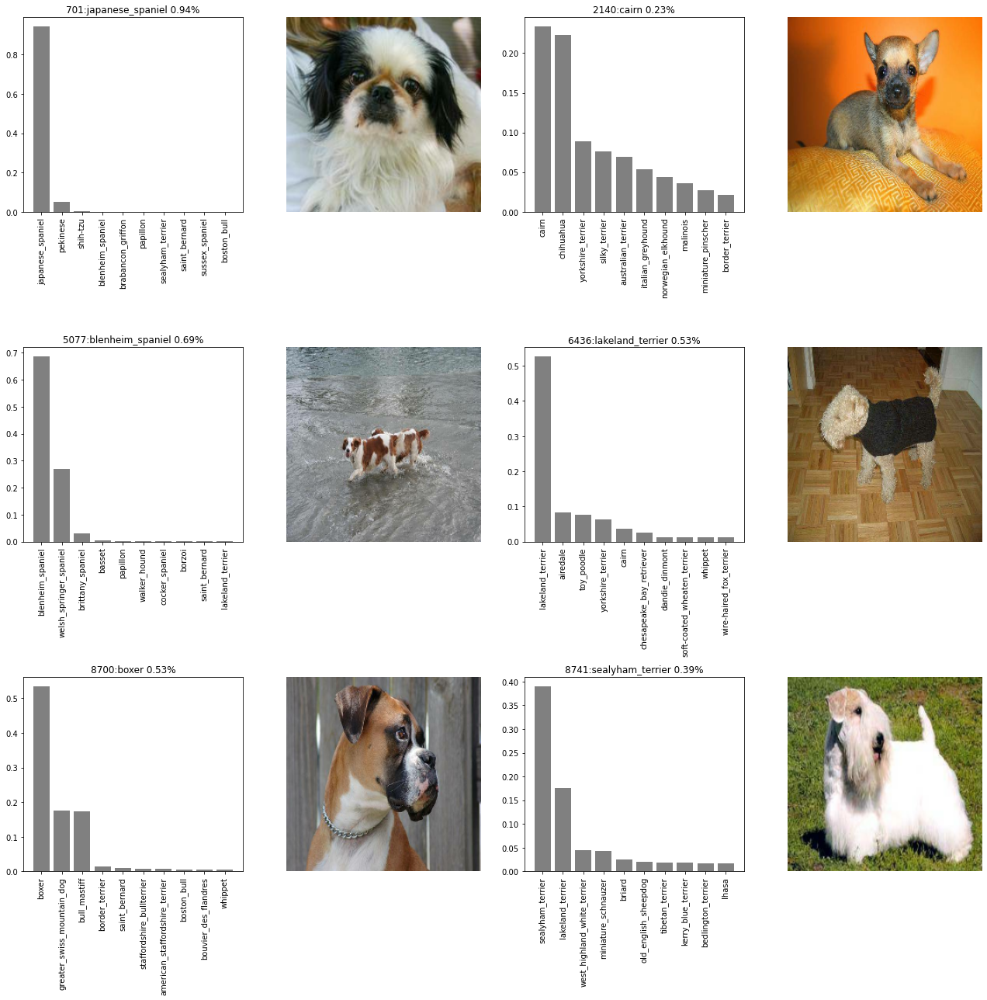

In [81]:
plloting_pred_conf_for_n_items(predictions, None, test_data_images, unique_labels, n=6)

## 12. Trying with our own images

In [33]:
# Read test data
own_data_path = '/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/dogs/'
df_own = pd.DataFrame({
    'id': sorted(os.listdir(own_data_path))
}) 

df_own['image_path'] = df_own['id'].apply(lambda x: own_data_path + x)
df_own['id'] = df_own['id'].apply(lambda x: os.path.splitext(x)[0])
df_own

,id,image_path
0,0,/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/dogs/0.jpg
1,1,/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/dogs/1.jpg
2,2,/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/dogs/2.jpg
3,3,/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/dogs/3.jpg
4,4,/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/dogs/4.png
5,5,/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/dogs/5.jpg
6,6,/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/dogs/6.jpg
7,7,/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/dogs/7.jpeg
8,8,/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/dogs/8.jpg
9,9,/content/drive/MyDrive/Colab Notebooks/Neural Networks | TensorFlow/data/dogs/9.jpg


In [34]:
# Create test data batch
X_own = df_own.image_path.tolist()
own_data = create_data_batches(X_own, test_data=True)

# Make predictions on the test data (not used to train on)
own_predictions = model.predict(own_data, verbose=1)
own_predictions.shape

Creating test data batches...
1/1 [==============================] - 9s 9s/step


(10, 120)

In [35]:
own_data_images = list(own_data.unbatch().as_numpy_iterator())

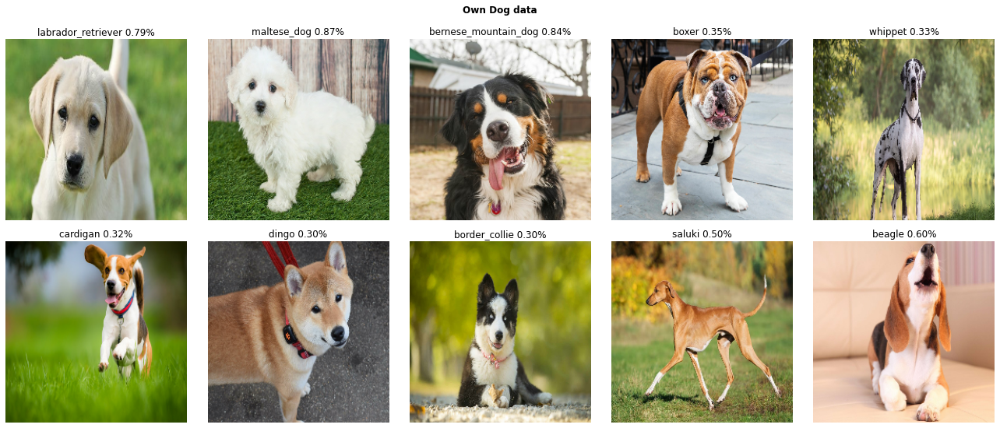

In [36]:
# Let's plot the top 10 predictions
predicted_label = unique_labels[own_predictions.argmax(axis=1)]
predicted_proba = own_predictions.max(axis=1)

own_predicted_index = range(10)

plotting_10_predicted_breeds(own_predicted_index, 'Own Dog data', 
                             predicted_label, predicted_proba, 
                             None, own_data_images, 
                             unique_labels=unique_labels)

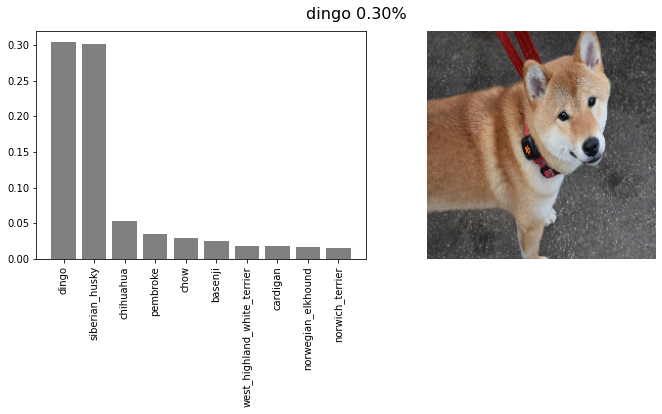

In [37]:
# Let's plot the confidence for an item
n=6
plloting_pred_conf(n, own_predictions, None, own_data_images, unique_labels)

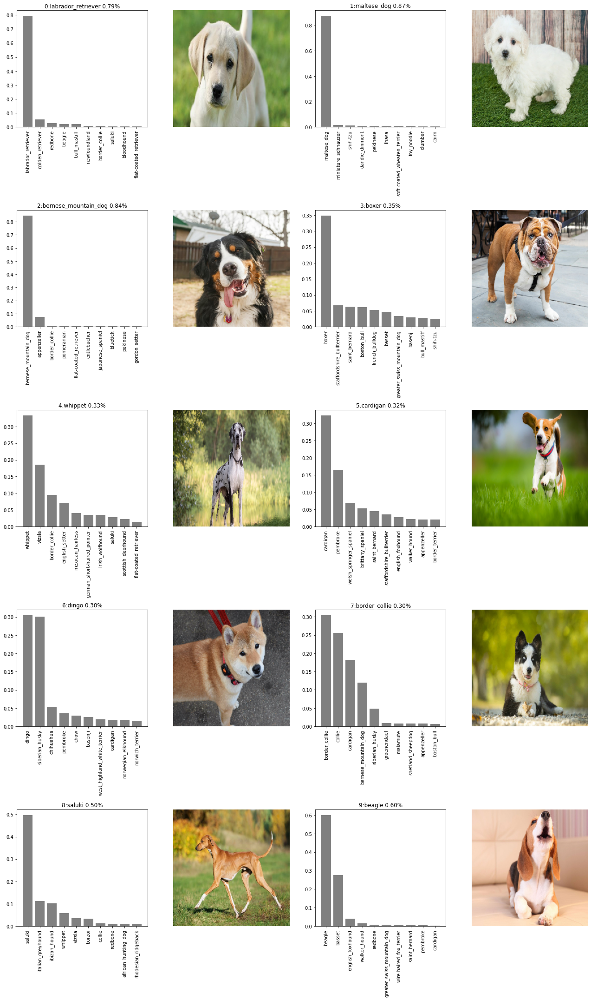

In [82]:
plloting_pred_conf_for_n_items(own_predictions, 
                               None, own_data_images, 
                               unique_labels, n=10)